In [1]:
import pandas as pd
import numpy as np
from random import *
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import files
files.upload()

Saving clean_kaggle_data_2022.csv to clean_kaggle_data_2022.csv


{'clean_kaggle_data_2022.csv': b'Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q6_10,Q6_11,Q6_12,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Q7_6,Q7_7,Q8,Q9,Q10_1,Q10_2,Q10_3,Q11,Q12_1,Q12_2,Q12_3,Q12_4,Q12_5,Q12_6,Q12_7,Q12_8,Q12_9,Q12_10,Q12_11,Q12_12,Q12_13,Q12_14,Q12_15,Q13_1,Q13_2,Q13_3,Q13_4,Q13_5,Q13_6,Q13_7,Q13_8,Q13_9,Q13_10,Q13_11,Q13_12,Q13_13,Q13_14,Q14_1,Q14_2,Q14_3,Q14_4,Q14_5,Q14_6,Q14_7,Q14_8,Q14_9,Q14_10,Q14_11,Q14_12,Q14_13,Q14_14,Q14_15,Q14_16,Q15_1,Q15_2,Q15_3,Q15_4,Q15_5,Q15_6,Q15_7,Q15_8,Q15_9,Q15_10,Q15_11,Q15_12,Q15_13,Q15_14,Q15_15,Q16,Q17_1,Q17_2,Q17_3,Q17_4,Q17_5,Q17_6,Q17_7,Q17_8,Q17_9,Q17_10,Q17_11,Q17_12,Q17_13,Q17_14,Q17_15,Q18_1,Q18_2,Q18_3,Q18_4,Q18_5,Q18_6,Q18_7,Q18_8,Q18_9,Q18_10,Q18_11,Q18_12,Q18_13,Q18_14,Q19_1,Q19_2,Q19_3,Q19_4,Q19_5,Q19_6,Q19_7,Q19_8,Q20_1,Q20_2,Q20_3,Q20_4,Q20_5,Q20_6,Q21_1,Q21_2,Q21_3,Q21_4,Q21_5,Q21_6,Q21_7,Q21_8,Q21_9,Q21_10,Q22,Q23,Q24,Q25,Q26,Q27,Q28_1,Q28_2,Q28_3,Q28_4,Q28_5,Q28_6,Q28_7,Q28_8,Q29,Q30,Q31_1,Q31

In [247]:
salaries = pd.read_csv("./clean_kaggle_data_2022.csv", low_memory = False, encoding = 'latin2')
salaries.shape

(8137, 298)

In [248]:
salaries.head()

,Duration (in seconds),Q2,Q3,Q4,Q5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,"Are you currently a student? (high school, uni...",On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,NaN,NaN
1,851,55-59,Man,France,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,501,30-34,Man,Germany,No,Coursera,edX,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,787,70+,Man,Australia,No,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,1132,40-44,Man,United States of America,No,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"


# Question 1: Data Cleaning

- Drop the second row since it is about the question details
- Drop other information too if they are irrelevant to the task

In [249]:
def CleanData(df):
    # Drop the first row (question details)
    df.drop(df.index[0], inplace=True)

    #TODO: Drop other information too here if they are irrelevant to the task
    df.drop('Duration (in seconds)', axis=1, inplace=True)
    df.drop('Q5', axis=1, inplace=True)

    return df

salaries = CleanData(salaries)
salaries.shape

(8136, 296)

In [250]:
salaries.head()

,Q2,Q3,Q4,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
1,55-59,Man,France,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,Udemy,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,30-34,Man,Germany,Coursera,edX,NaN,NaN,NaN,Udacity,Udemy,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,70+,Man,Australia,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,40-44,Man,United States of America,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,Udacity,Udemy,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"
5,40-44,Man,United States of America,Coursera,NaN,NaN,NaN,NaN,Udacity,Udemy,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...","Journal Publications (peer-reviewed journals, ...",NaN,NaN,NaN,13.0,"200,000-299,999"


###**Impute missing values (single column responses)**

1. Identify columns with single column responses

2. Address missing values in those columns

In [251]:
def ImputingSingleColMissingValues(df):
    # Identify single-column responses by checking if column names do not contain '_'
    single_col_names = [col for col in df.columns if '_' not in col]

    # Dictionary to record filled values for each column with missing data
    filled_values = {}

    print("Percentage of null values before filling: ")
    print(df[single_col_names].isnull().sum() * 100 / len(df))

    # Impute missing values and record what was filled
    for col in single_col_names:
        if df[col].isnull().sum() > 0:  # Only process columns with missing values
            if df[col].dtype == 'float' or df[col].dtype == 'int':
                fill_value = df[col].mean()
                df[col].fillna(fill_value, inplace=True)
            else:
                # For categorical columns, fill missing values based on mode within each Q29_Encoded group
                mode_values = df.groupby('Q29_Encoded')[col].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
                df[col].fillna(mode_values, inplace=True)

                # Save the mode applied for reporting purposes
                filled_values[col] = df.groupby('Q29_Encoded')[col].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None).to_dict()

    # Display the filled values for each column
    print("\nFilled values for columns with missing data:")
    for col, value in filled_values.items():
        print(f"Column '{col}': filled with mode by Q29_Encoded groups: {value}")

    print("\nPercentage of null values after filling (should all be zeros):")
    print(df[single_col_names].isnull().sum() * 100 / len(df))
    assert df[single_col_names].isnull().values.sum() == 0, \
        "There are still missing values remaining!"

    return df

# Assuming `salaries` is your DataFrame
salaries = ImputingSingleColMissingValues(salaries)


Percentage of null values before filling: 
Q2      0.000000
Q3      0.000000
Q4      0.000000
Q8      0.000000
Q9     36.147984
Q11     0.000000
Q16     8.407080
Q22    80.162242
Q23     0.000000
Q24     0.000000
Q25     0.000000
Q26     0.000000
Q27     0.000000
Q29     0.000000
Q30     0.614553
Q32    77.126352
Q43    45.759587
dtype: float64

Filled values for columns with missing data:
Column 'Q9': filled with mode by Q29_Encoded groups: {0.0: 'No', 1.0: 'No', 2.0: 'No', 3.0: 'Yes', 4.0: 'Yes', 5.0: 'Yes', 6.0: 'Yes', 7.0: 'Yes', 8.0: 'Yes', 9.0: 'Yes', 10.0: 'Yes', 11.0: 'Yes', 12.0: 'Yes', 13.0: 'Yes', 14.0: 'Yes'}
Column 'Q16': filled with mode by Q29_Encoded groups: {0.0: 'Under 1 year', 1.0: 'Under 1 year', 2.0: 'Under 1 year', 3.0: 'Under 1 year', 4.0: 'Under 1 year', 5.0: 'Under 1 year', 6.0: 'Under 1 year', 7.0: 'Under 1 year', 8.0: '2-3 years', 9.0: '1-2 years', 10.0: '5-10 years', 11.0: '5-10 years', 12.0: '5-10 years', 13.0: '5-10 years', 14.0: '5-10 years'}
Column 'Q22'

In [252]:
salaries

,Q2,Q3,Q4,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,...,Q44_5,Q44_6,Q44_7,Q44_8,Q44_9,Q44_10,Q44_11,Q44_12,Q29_Encoded,Q29_buckets
1,55-59,Man,France,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,Udemy,...,"Course Forums (forums.fast.ai, Coursera forums...",NaN,NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,2.0,"20,000-29,999"
2,30-34,Man,Germany,Coursera,edX,NaN,NaN,NaN,Udacity,Udemy,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
3,70+,Man,Australia,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,NaN,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...",NaN,NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
4,40-44,Man,United States of America,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,Udacity,Udemy,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,13.0,"200,000-299,999"
5,40-44,Man,United States of America,Coursera,NaN,NaN,NaN,NaN,Udacity,Udemy,...,NaN,NaN,"Podcasts (Chai Time Data Science, OEEReilly...","Blogs (Towards Data Science, Analytics Vidhya,...","Journal Publications (peer-reviewed journals, ...",NaN,NaN,NaN,13.0,"200,000-299,999"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,40-44,Man,United States of America,NaN,NaN,Kaggle Learn Courses,DataCamp,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,"Blogs (Towards Data Science, Analytics Vidhya,...",NaN,NaN,NaN,NaN,10.0,"100,000-124,999"
8133,35-39,Man,India,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,0.0,"0-9,999"
8134,40-44,Man,India,NaN,NaN,NaN,DataCamp,NaN,NaN,Udemy,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,0.0,"0-9,999"
8135,25-29,Man,Turkey,NaN,NaN,NaN,DataCamp,NaN,NaN,Udemy,...,NaN,"YouTube (Kaggle YouTube, Cloud AI Adventures, ...",NaN,NaN,NaN,NaN,NaN,NaN,2.0,"20,000-29,999"


###**Fixed Column Q26**

In [253]:

# Define a function to correct the experience values
def correct_experience(value):
    if isinstance(value, str):
        parts = value.split('-')
        if len(parts) == 2:
            # Convert month names to numbers for the end range
            start = int(parts[0])
            end = {
                "Jan": "1",
                "Feb": "2",
                "Mar": "3",
                "Apr": "4",
                "May": "5",
                "Jun": "6",
                "Jul": "7",
                "Aug": "8",
                "Sep": "9",
                "Oct": "10",
                "Nov": "11",
                "Dec": "12"
            }.get(parts[1], parts[1])  # Defaults to original part if no match found

            # Ensure start is less than or equal to end
            start, end = min(start, int(end)), max(start, int(end))

            return f"{start} - {end}"
    return value  # Return the original if it's not a string or doesn't match the pattern

# Apply the correction to the 'Q_26' column
salaries['Q26'] = salaries['Q26'].apply(correct_experience)


In [254]:
column_to_display = 'Q26'

# Display unique values in the column
unique_values = salaries[column_to_display].unique()
print("Unique values in the column:", unique_values)

Unique values in the column: ['1 - 2' '20+' '3 - 4' '5 - 9' '0' '10 - 14' '15 - 19']


###**Encode categorical features (sinlge column responses)**

In [255]:
#TODO: Encode categorical features in the single column responses
from sklearn.preprocessing import OrdinalEncoder
import pandas as pd

def encode_columns(df):
    # Define columns for each encoding type
    ordinal_cols = ['Q2', 'Q11', 'Q16', 'Q25', 'Q26', 'Q29', 'Q30', 'Q43']
    one_hot_cols = ['Q3', 'Q4', 'Q8', 'Q9', 'Q22', 'Q23', 'Q24', 'Q27', 'Q32']

    # Define custom ordinal mappings
    custom_ordinal_mappings = {
        'Q2': ['18-21', '22-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-69', '70+'],
        'Q11': ['I have never written code', '< 1 years', '1-3 years', '3-5 years', '5-10 years', '10-20 years', '20+ years'],
        'Q16': ['I do not use machine learning methods', 'Under 1 year', '1-2 years', '2-3 years', '3-4 years', '4-5 years', '5-10 years', '10-20 years'],
        'Q25': ['0-49 employees', '50-249 employees', '250-999 employees', '1000-9,999 employees', '10,000 or more employees'],
        'Q26': ['0', '1 - 2', '3 - 4', '5 - 9', '10 - 14', '15 - 19', '20+'],
        'Q29': ['$0-999', '1,000-1,999', '2,000-2,999', '3,000-3,999', '4,000-4,999', '5,000-7,499', '7,500-9,999', '10,000-14,999', '15,000-19,999', '20,000-24,999',
                '25,000-29,999', '30,000-39,999', '40,000-49,999', '50,000-59,999', '60,000-69,999', '70,000-79,999', '80,000-89,999', '90,000-99,999', '100,000-124,999',
                '125,000-149,999', '150,000-199,999', '200,000-249,999', '250,000-299,999', '300,000-499,999', '$500,000-999,999', '>$1,000,000'],
        'Q30': ['$0 ($USD)', '$1-$99', '$100-$999', '$1000-$9,999', '$10,000-$99,999', '$100,000 or more ($USD)'],
        'Q43': ['Unknown', 'Never', 'Once', '2-5 times', '6-25 times', 'More than 25 times']
    }

    # Ordinal encoding
    for col in ordinal_cols:
        if col in custom_ordinal_mappings:
            # Convert each value to a corresponding integer based on the custom order
            mapping = custom_ordinal_mappings[col]
            ordinal_encoder = OrdinalEncoder(categories=[mapping])
            df[col] = ordinal_encoder.fit_transform(df[[col]]).astype(int)

    # One-hot encoding
    df = pd.get_dummies(df, columns=one_hot_cols, drop_first=True)

    return df

# Apply the encoding function to the dataframe
salaries = encode_columns(salaries)


In [256]:
salaries

,Q2,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,...,Q32_ Huawei Cloud,Q32_ IBM Cloud / Red Hat,Q32_ Microsoft Azure,Q32_ Oracle Cloud,Q32_ SAP Cloud,Q32_ Tencent Cloud,Q32_ VMware Cloud,Q32_None were satisfactory,Q32_Other,Q32_They all had a similarly enjoyable developer experience
1,8,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,Udemy,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
2,3,Coursera,edX,NaN,NaN,NaN,Udacity,Udemy,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
3,10,Coursera,NaN,Kaggle Learn Courses,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,False,True
4,5,Coursera,NaN,Kaggle Learn Courses,NaN,Fast.ai,Udacity,Udemy,NaN,NaN,...,False,False,False,False,False,False,False,False,False,True
5,5,Coursera,NaN,NaN,NaN,NaN,Udacity,Udemy,NaN,"Cloud-certification programs (direct from AWS,...",...,False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8132,5,NaN,NaN,Kaggle Learn Courses,DataCamp,NaN,NaN,NaN,LinkedIn Learning,"Cloud-certification programs (direct from AWS,...",...,False,False,False,False,False,False,False,False,False,False
8133,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
8134,5,NaN,NaN,NaN,DataCamp,NaN,NaN,Udemy,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False
8135,2,NaN,NaN,NaN,DataCamp,NaN,NaN,Udemy,NaN,NaN,...,False,False,False,False,False,False,False,False,False,False


###**Handling categorical features (multi column responses)**

In [257]:
def handle_multi_column_responses(df):
    # Step 1: Identify multi-column responses
    # Group columns by prefix up to the first underscore (or other delimiter as per your dataset)
    multi_col_groups = {}
    for col in df.columns:
        if '_' in col:
            prefix = col.split('_')[0]
            if prefix not in multi_col_groups:
                multi_col_groups[prefix] = []
            multi_col_groups[prefix].append(col)

    # Print the identified multi-column response groups
    print("Identified multi-column responses:")
    for prefix, cols in multi_col_groups.items():
        print(f"{prefix}: {cols}")

    # Step 2: Check for missing values and replace missing with 0, others with 1
    for prefix, cols in multi_col_groups.items():
        # Replace NaNs with 0
        df[cols] = df[cols].fillna(0)
        # Replace any non-zero or non-NaN values with 1
        df[cols] = df[cols].applymap(lambda x: 1 if x != 0 else 0)
        print(f"Values in {prefix} group have been updated: NaNs filled with 0, other values set to 1.")

    return df

# Assuming `salaries` is your DataFrame
salaries = handle_multi_column_responses(salaries)


Identified multi-column responses:
Q6: ['Q6_1', 'Q6_2', 'Q6_3', 'Q6_4', 'Q6_5', 'Q6_6', 'Q6_7', 'Q6_8', 'Q6_9', 'Q6_10', 'Q6_11', 'Q6_12']
Q7: ['Q7_1', 'Q7_2', 'Q7_3', 'Q7_4', 'Q7_5', 'Q7_6', 'Q7_7']
Q10: ['Q10_1', 'Q10_2', 'Q10_3']
Q12: ['Q12_1', 'Q12_2', 'Q12_3', 'Q12_4', 'Q12_5', 'Q12_6', 'Q12_7', 'Q12_8', 'Q12_9', 'Q12_10', 'Q12_11', 'Q12_12', 'Q12_13', 'Q12_14', 'Q12_15']
Q13: ['Q13_1', 'Q13_2', 'Q13_3', 'Q13_4', 'Q13_5', 'Q13_6', 'Q13_7', 'Q13_8', 'Q13_9', 'Q13_10', 'Q13_11', 'Q13_12', 'Q13_13', 'Q13_14']
Q14: ['Q14_1', 'Q14_2', 'Q14_3', 'Q14_4', 'Q14_5', 'Q14_6', 'Q14_7', 'Q14_8', 'Q14_9', 'Q14_10', 'Q14_11', 'Q14_12', 'Q14_13', 'Q14_14', 'Q14_15', 'Q14_16']
Q15: ['Q15_1', 'Q15_2', 'Q15_3', 'Q15_4', 'Q15_5', 'Q15_6', 'Q15_7', 'Q15_8', 'Q15_9', 'Q15_10', 'Q15_11', 'Q15_12', 'Q15_13', 'Q15_14', 'Q15_15']
Q17: ['Q17_1', 'Q17_2', 'Q17_3', 'Q17_4', 'Q17_5', 'Q17_6', 'Q17_7', 'Q17_8', 'Q17_9', 'Q17_10', 'Q17_11', 'Q17_12', 'Q17_13', 'Q17_14', 'Q17_15']
Q18: ['Q18_1', 'Q18_2', 'Q18_3',

In [258]:
salaries.head()

,Q2,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,...,Q32_ Huawei Cloud,Q32_ IBM Cloud / Red Hat,Q32_ Microsoft Azure,Q32_ Oracle Cloud,Q32_ SAP Cloud,Q32_ Tencent Cloud,Q32_ VMware Cloud,Q32_None were satisfactory,Q32_Other,Q32_They all had a similarly enjoyable developer experience
1,8,1,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,1,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,5,1,0,1,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
5,5,1,0,0,0,0,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0


###**Drop the target variable(s) and get the target variable**

In [259]:
# Make sure there are no missing values remaining in the dataset
assert salaries.isnull().values.sum() == 0, \
    "There are still {} missing values remaining in salaries!".format(
        salaries.isnull().values.sum()
    )

In [260]:
# Set the target variable
target = salaries['Q29_Encoded']

# Drop the target variables and other specified columns from the feature set
salaries = salaries.drop(columns=['Q29', 'Q29_Encoded', 'Q29_buckets'], errors='ignore')

# Define features explicitly after dropping target columns
features = salaries

# Make sure the target variables are not included in the feature set
for col in features.columns:
    assert 'Q29' not in col, \
        "Target variable ({}) is still in the dataset".format(col)



# Question 2: Exploratory Feature Analysis

- From Question 2 - Question 4, you should **NOT** peek at the test labels in any form!
- Assume that you do not know the target values (Q29_Encoded) on the test set

## Split data into training and test sets

In [261]:
# You can use from sklearn.model_selection.train_test_split()
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state=42, shuffle=True)


## **Feature Engineering/Generation**

- Create new feature(s) using existing features!

In [262]:
#TODO: Create new features (feature generation)

# Age and experience ratio
X_train['age_exp_ratio'] = X_train['Q11'] / (X_train['Q2'] + 1e-5)
# Spending and team size interaction
X_train['spending_team_ratio'] = X_train['Q30'] / (X_train['Q26'] + 1e-5)

In [263]:
new_columns = [
    'age_exp_ratio',
    'spending_team_ratio'
]

# Show the first few rows of only the new columns
print(X_train[new_columns].head())

      age_exp_ratio  spending_team_ratio
2046       0.200000             0.666664
2930       0.499998             0.000000
463        0.499999        200000.000000
1957       0.666664        100000.000000
4296       0.200000             0.000000


## **Feature Selection**

- Select the features based on the criteria of your choice

In [264]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
import numpy as np
import pandas as pd
from sklearn.feature_selection import SelectFromModel


# Initialize components
scaler = StandardScaler()
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables to store the best model and parameters
best_model = None
best_params = {}
best_accuracy = 0
best_f1 = 0
best_features = None

# Loop through different values of C and solver
for C in [0.1]:
    for solver in ['liblinear']:
        model = LogisticRegression(C=C, penalty='l1', solver=solver, max_iter=1000, multi_class='ovr', random_state=42)
        accuracy_scores = []
        f1_scores = []

        # Perform stratified k-fold cross-validation
        for train_idx, val_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

            # Feature scaling
            X_train_fold_scaled = scaler.fit_transform(X_train_fold)
            X_val_fold_scaled = scaler.transform(X_val_fold)

            # Train the model
            model.fit(X_train_fold_scaled, y_train_fold)

            # Make predictions
            predictions = model.predict(X_val_fold_scaled)

            # Calculate metrics
            accuracy_scores.append(accuracy_score(y_val_fold, predictions))
            f1_scores.append(f1_score(y_val_fold, predictions, average='weighted'))

        # Check if the current model has the best performance
        mean_accuracy = np.mean(accuracy_scores)
        mean_f1 = np.mean(f1_scores)

        if mean_f1 > best_f1:
            best_model = model
            best_params = {'C': C, 'solver': solver}
            best_accuracy = mean_accuracy
            best_f1 = mean_f1

# Feature selection using the best model
selector = SelectFromModel(best_model, prefit=True)
best_features = X_train.columns[selector.get_support()].tolist()

# Print results
print("Best parameters:", best_params)
print(f"Best Cross-Validation Accuracy: {best_accuracy:.3f}")
print(f"Best Cross-Validation F1-Score: {best_f1:.3f}")
print("\nSelected features:")
for feature in best_features:
    print(feature)


# Feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': np.abs(best_model.coef_).mean(axis=0)
})
feature_importance = feature_importance.sort_values('Importance', ascending=False)
print("\nTop 10 features by importance:")
print(feature_importance.head(10))

Best parameters: {'C': 0.1, 'solver': 'liblinear'}
Best Cross-Validation Accuracy: 0.867
Best Cross-Validation F1-Score: 0.868

Selected features:
Q2
Q6_1
Q6_2
Q6_5
Q6_6
Q6_7
Q6_12
Q7_1
Q7_3
Q7_4
Q7_6
Q7_7
Q10_1
Q10_2
Q10_3
Q11
Q12_2
Q12_4
Q12_5
Q12_6
Q12_7
Q12_8
Q12_9
Q12_12
Q12_13
Q13_1
Q13_3
Q13_4
Q13_7
Q13_8
Q13_10
Q13_11
Q13_12
Q14_3
Q14_5
Q14_7
Q14_9
Q14_10
Q14_11
Q14_12
Q14_13
Q14_14
Q15_1
Q15_2
Q15_4
Q15_5
Q15_7
Q15_9
Q15_10
Q15_13
Q15_15
Q16
Q17_1
Q17_2
Q17_3
Q17_4
Q17_5
Q17_10
Q17_11
Q17_12
Q18_3
Q18_5
Q18_6
Q18_7
Q18_11
Q18_12
Q19_1
Q19_2
Q19_4
Q19_6
Q20_1
Q21_1
Q21_3
Q21_4
Q21_5
Q21_6
Q21_7
Q21_8
Q21_10
Q25
Q26
Q28_1
Q28_3
Q28_4
Q28_5
Q28_6
Q28_7
Q30
Q31_3
Q31_4
Q31_6
Q31_7
Q31_8
Q31_10
Q31_12
Q33_2
Q34_3
Q34_6
Q34_8
Q35_1
Q35_2
Q35_3
Q35_4
Q35_5
Q35_7
Q35_8
Q35_10
Q35_11
Q35_14
Q36_7
Q36_10
Q37_4
Q37_8
Q37_9
Q37_11
Q38_2
Q38_3
Q38_4
Q38_6
Q38_7
Q38_8
Q39_2
Q39_4
Q39_6
Q39_9
Q39_12
Q40_1
Q40_2
Q40_4
Q40_6
Q40_8
Q40_9
Q40_10
Q40_13
Q40_14
Q40_15
Q41_1
Q41_4
Q41_5
Q41_9
Q42_1

In [265]:
for feature in best_features:
    print(feature)


# Feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': np.abs(best_model.coef_).mean(axis=0)
})
feature_importance = feature_importance.sort_values('Importance', ascending=False)
print("\nTop 40 features by importance:")
print(feature_importance.head(34))

Q2
Q6_1
Q6_2
Q6_5
Q6_6
Q6_7
Q6_12
Q7_1
Q7_3
Q7_4
Q7_6
Q7_7
Q10_1
Q10_2
Q10_3
Q11
Q12_2
Q12_4
Q12_5
Q12_6
Q12_7
Q12_8
Q12_9
Q12_12
Q12_13
Q13_1
Q13_3
Q13_4
Q13_7
Q13_8
Q13_10
Q13_11
Q13_12
Q14_3
Q14_5
Q14_7
Q14_9
Q14_10
Q14_11
Q14_12
Q14_13
Q14_14
Q15_1
Q15_2
Q15_4
Q15_5
Q15_7
Q15_9
Q15_10
Q15_13
Q15_15
Q16
Q17_1
Q17_2
Q17_3
Q17_4
Q17_5
Q17_10
Q17_11
Q17_12
Q18_3
Q18_5
Q18_6
Q18_7
Q18_11
Q18_12
Q19_1
Q19_2
Q19_4
Q19_6
Q20_1
Q21_1
Q21_3
Q21_4
Q21_5
Q21_6
Q21_7
Q21_8
Q21_10
Q25
Q26
Q28_1
Q28_3
Q28_4
Q28_5
Q28_6
Q28_7
Q30
Q31_3
Q31_4
Q31_6
Q31_7
Q31_8
Q31_10
Q31_12
Q33_2
Q34_3
Q34_6
Q34_8
Q35_1
Q35_2
Q35_3
Q35_4
Q35_5
Q35_7
Q35_8
Q35_10
Q35_11
Q35_14
Q36_7
Q36_10
Q37_4
Q37_8
Q37_9
Q37_11
Q38_2
Q38_3
Q38_4
Q38_6
Q38_7
Q38_8
Q39_2
Q39_4
Q39_6
Q39_9
Q39_12
Q40_1
Q40_2
Q40_4
Q40_6
Q40_8
Q40_9
Q40_10
Q40_13
Q40_14
Q40_15
Q41_1
Q41_4
Q41_5
Q41_9
Q42_1
Q42_2
Q42_3
Q43
Q44_3
Q44_4
Q44_5
Q44_6
Q44_7
Q44_8
Q44_12
Q3_Nonbinary
Q3_Prefer not to say
Q3_Prefer to self-describe
Q3_Woman
Q4_Argentina
Q4_A

In [266]:
# Select the top 34 features
selected_features = feature_importance.head(34)['Feature'].tolist()
print("\nSelected features:\n", selected_features)


Selected features:
 ['Q9_Yes', 'Q32_ Google Cloud Platform (GCP) ', 'Q32_ Amazon Web Services (AWS) ', 'Q22_ Kaggle datasets ', 'Q4_United States of America', 'Q10_2', 'Q10_3', 'Q10_1', 'Q11', 'Q4_United Kingdom of Great Britain and Northern Ireland', 'Q27_We have well established ML methods (i.e., models in production for more than 2 years)', 'Q30', 'Q4_Pakistan', 'Q4_Sri Lanka', 'Q4_Nigeria', 'Q23_Manager (Program, Project, Operations, Executive-level, etc)', 'Q16', 'Q4_Portugal', 'Q2', 'Q4_France', 'Q28_7', 'Q28_3', 'Q25', 'Q4_Italy', 'Q26', 'Q4_Spain', 'Q21_1', 'Q12_9', 'Q32_ Microsoft Azure ', 'Q23_Teacher / professor', 'Q44_8', 'Q4_Poland', 'Q3_Woman', 'Q35_7']


## **Visualization**

- Make visualization to better understand your data

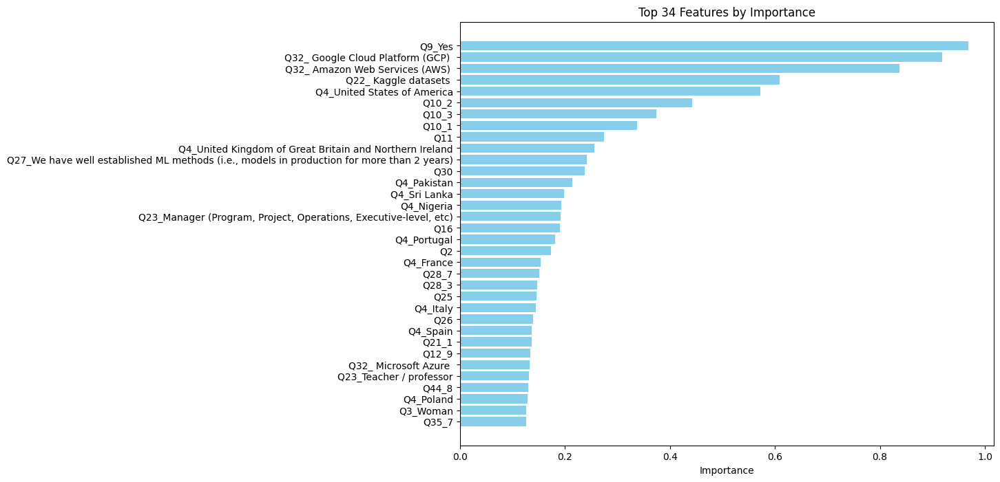

In [267]:
# Plotting the top 34 features
top_features = feature_importance.head(34)

plt.figure(figsize=(10, 8))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.title('Top 34 Features by Importance')
plt.show()

In [268]:
X_train_selected = X_train[selected_features]

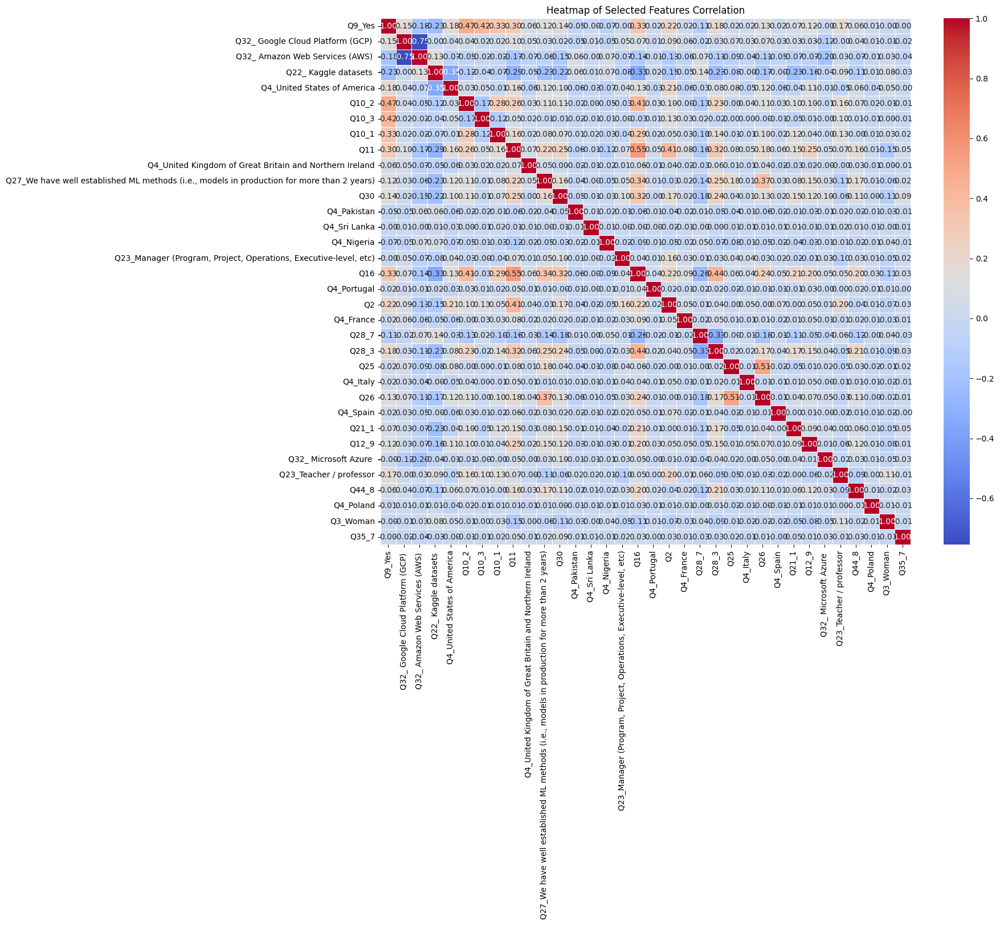

In [269]:
df_selected = salaries[selected_features]

# Calculate the correlation matrix
correlation_matrix = df_selected.corr()

# Plot the heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Heatmap of Selected Features Correlation")
plt.show()

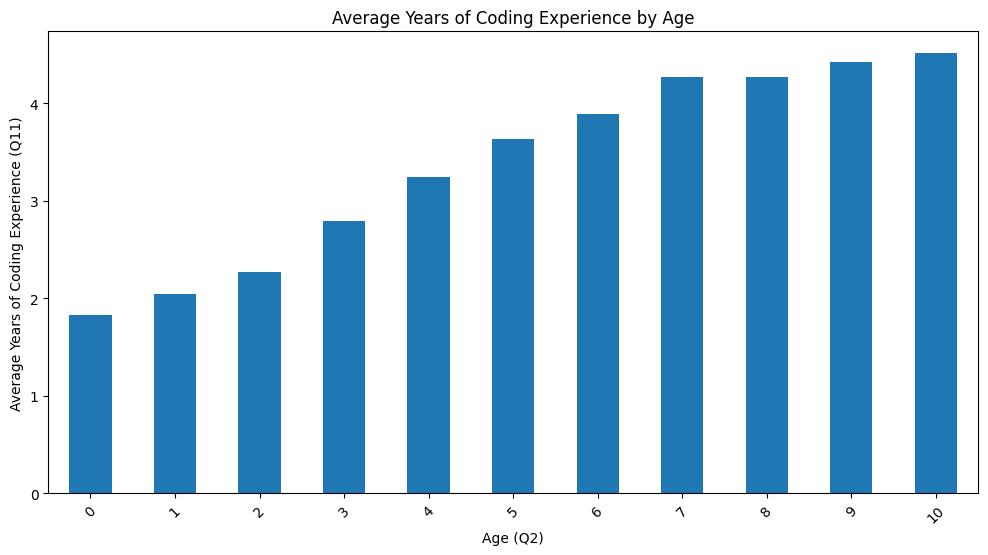

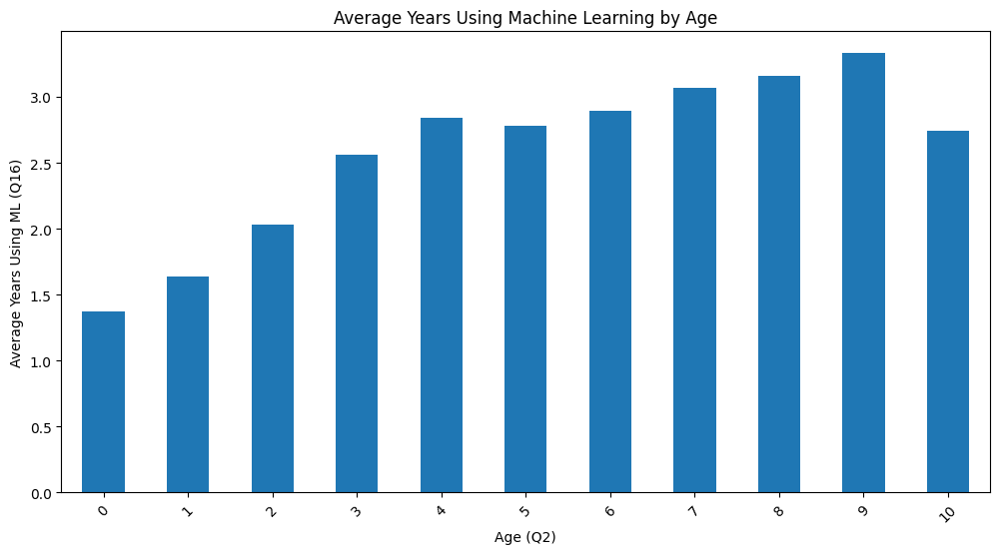

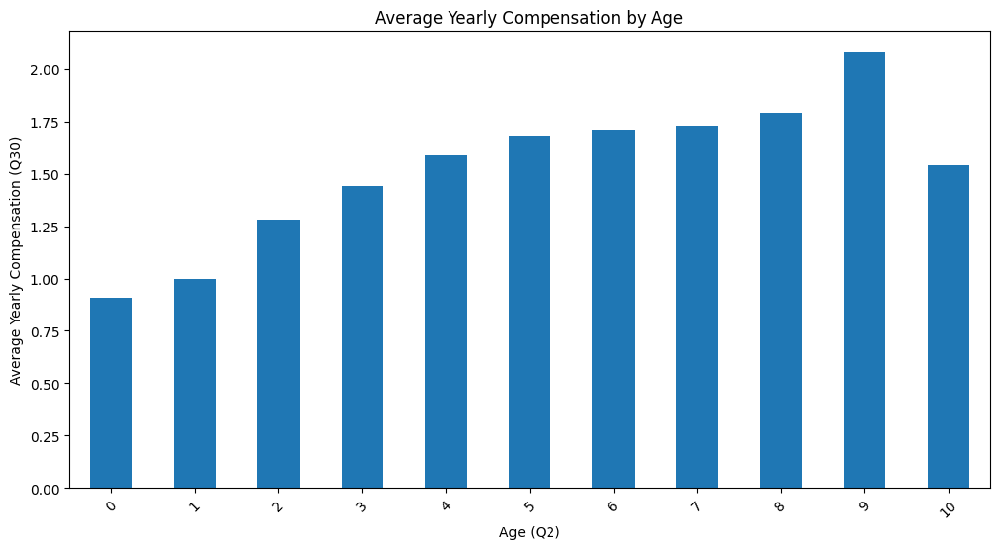

In [270]:
# Bar Plot 1: Average Years of Coding Experience by Age
plt.figure(figsize=(12, 6))
age_coding_exp = X_train.groupby('Q2')['Q11'].mean()  # Adjust to `.median()` if you prefer the median
age_coding_exp.plot(kind='bar')
plt.title('Average Years of Coding Experience by Age')
plt.xlabel('Age (Q2)')
plt.ylabel('Average Years of Coding Experience (Q11)')
plt.xticks(rotation=45)
plt.show()

# Bar Plot 2: Average Years Using Machine Learning by Age
plt.figure(figsize=(12, 6))
age_ml_exp = X_train.groupby('Q2')['Q16'].mean()  # Adjust to `.median()` if you prefer the median
age_ml_exp.plot(kind='bar')
plt.title('Average Years Using Machine Learning by Age')
plt.xlabel('Age (Q2)')
plt.ylabel('Average Years Using ML (Q16)')
plt.xticks(rotation=45)
plt.show()

# Bar Plot 3: Average Yearly Compensation by Age
plt.figure(figsize=(12, 6))
age_compensation = X_train.groupby('Q2')['Q30'].mean()  # Adjust to `.median()` if you prefer the median
age_compensation.plot(kind='bar')
plt.title('Average Yearly Compensation by Age')
plt.xlabel('Age (Q2)')
plt.ylabel('Average Yearly Compensation (Q30)')
plt.xticks(rotation=45)
plt.show()


## **Apply the same feature engineering/selection to test data**

In [271]:
#TODO: Feature generation code you applied to the training data

# Age and experience ratio
X_test['age_exp_ratio'] = X_test['Q11'] / (X_test['Q2'] + 1e-5)
# Spending and team size interaction
X_test['spending_team_ratio'] = X_test['Q30'] / (X_test['Q26'] + 1e-5)

# Leave selected features
X_test_selected = X_test[selected_features]



In [272]:
X_train = X_train_selected.values
X_test = X_test_selected.values
y_train = y_train.values
y_test = y_test.values

In [273]:
X_train

array([[0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 1, 0],
       ...,
       [1, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0]])

In [274]:
y_train

array([0, 0, 1, ..., 1, 1, 0])

In [275]:
y_test

array([0, 0, 1, ..., 0, 1, 0])

In [276]:
X_test

array([[0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [1, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 1, ..., 0, 0, 0],
       [1, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0]])

# Question 3: Model Implementation

## Implement Ordinal Logistic Regression Model

In [277]:
import numpy as np
from sklearn.linear_model import LogisticRegression

class OrdinalLogisticRegression:
    def __init__(self, max_iter=1000, class_weight='balanced', C=1.0, penalty='l2', solver='liblinear'):

        self.max_iter = max_iter
        self.C = C
        self.class_weight = class_weight
        self.penalty = penalty
        self.solver = solver
        self.classes_ = []
        self.models_ = []

    def fit(self, X, y):

        # Sort and store unique class labels
        self.classes_ = sorted(np.unique(y))
        self.models_ = []

        # Train k-1 binary logistic regression models
        for i, c in enumerate(self.classes_[:-1]):  # Only k-1 classifiers needed
            # Create binary labels: 0 if class <= c, 1 otherwise
            y_i = np.where(y <= c, 0, 1)

            # Initialize and fit a logistic regression model with specified hyperparameters
            model = LogisticRegression(
                max_iter=self.max_iter,
                C=self.C,
                class_weight=self.class_weight,
                penalty=self.penalty,
                solver=self.solver
            )
            model.fit(X, y_i)
            self.models_.append(model)

        return self

    def predict_proba(self, X):

        assert len(self.models_) > 0, "Model is not fitted yet. Run .fit() first."

        # Predicted probabilities for k-1 binary classifiers
        binary_probabilities = np.empty((X.shape[0], len(self.models_), 2), dtype=float)

        # Predict probabilities for each binary classifier
        for i, model in enumerate(self.models_):
            binary_probabilities[:, i] = model.predict_proba(X)

        # Calculate class probabilities from binary classifiers
        k = len(self.classes_)
        proba = np.empty((X.shape[0], k), dtype=float)

        # Compute class probabilities
        proba[:, 0] = binary_probabilities[:, 0, 0]  # Probability of being in the 0th class

        for i in range(1, k - 1):
            proba[:, i] = binary_probabilities[:, i, 0] - binary_probabilities[:, i - 1, 0]

        proba[:, -1] = binary_probabilities[:, k - 2, 1]  # Probability of being in the last class

        # Ensure probabilities sum to 1, allowing for floating-point tolerance
        assert (proba.sum(axis=1) == 1).all(), \
            'There is a problem in the probability computation'
        return proba

    def predict(self, X):

        proba = self.predict_proba(X)
        return np.argmax(proba, axis=1)

    def get_params(self, deep=True):

        return {
            'max_iter': self.max_iter,
            'C': self.C,
            'class_weight': self.class_weight,
            'penalty': self.penalty,
            'solver': self.solver
        }

    def set_params(self, **parameters):

        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self


## Run k-fold cross validation

- Report the average/variance of accuracies across folds

In [278]:
X_train_np = np.array(X_train)
X_test_np = np.array(X_test)
y_train_np = np.array(y_train)
y_test_np = np.array(y_test)


In [279]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np

# Define the number of folds
k = 10  # Adjust this based on your requirements
kf = KFold(n_splits=k, shuffle=True, random_state=42)

# Initialize the model (assuming OrdinalLogisticRegression is already defined)
model = OrdinalLogisticRegression(max_iter=100, C=1.0)

# Convert data to numpy arrays if not already done
X_train_np = X_train.values if hasattr(X_train, 'values') else X_train
y_train_np = y_train.values if hasattr(y_train, 'values') else y_train

accuracies = []

# Perform k-fold cross-validation
for fold, (train_index, val_index) in enumerate(kf.split(X_train_np), 1):
    X_train_fold, X_val_fold = X_train_np[train_index], X_train_np[val_index]
    y_train_fold, y_val_fold = y_train_np[train_index], y_train_np[val_index]

    # Fit the model on the training fold
    model.fit(X_train_fold, y_train_fold)

    # Predict on the validation fold
    y_pred = model.predict(X_val_fold)

    # Calculate accuracy and store it
    accuracy = accuracy_score(y_val_fold, y_pred)
    accuracies.append(accuracy)

    # Print accuracy for the current fold
    print(f"Fold {fold}: Accuracy = {accuracy:.4f}")

# Calculate the average and variance of accuracies
average_accuracy = np.mean(accuracies)
variance_accuracy = np.var(accuracies)

# Report the average and variance of accuracies across folds
print("\nAverage accuracy    : ", average_accuracy)
print("Variance of accuracy: ", variance_accuracy)


Fold 1: Accuracy = 0.8561
Fold 2: Accuracy = 0.8491
Fold 3: Accuracy = 0.8719
Fold 4: Accuracy = 0.8491
Fold 5: Accuracy = 0.8614
Fold 6: Accuracy = 0.8770
Fold 7: Accuracy = 0.8664
Fold 8: Accuracy = 0.8506
Fold 9: Accuracy = 0.8541
Fold 10: Accuracy = 0.8805

Average accuracy    :  0.8616366046927512
Variance of accuracy:  0.00012410862041972156


## Bias-variance trade-off

[bias_variance_decomp.py](https://github.com/rasbt/mlxtend/blob/master/mlxtend/evaluate/bias_variance_decomp.py)

Below is a function you can use to compute the bias and variance of your ordinal logistic regression model. Using this function, analyze the ordinal logistic regression model performance based on bias-variance trade-off.

In [280]:
### NOTE: You don't need to change anything in this code block! ###

def _draw_bootstrap_sample(rng, X, y):
    sample_indices = np.arange(X.shape[0])
    bootstrap_indices = rng.choice(
        sample_indices, size=sample_indices.shape[0], replace=True
    )
    return X[bootstrap_indices], y[bootstrap_indices]

def bias_variance_decomp(
    estimator,
    X_train,
    y_train,
    X_test,
    y_test,
    num_rounds=10,
    random_seed=0
):
    """
    estimator : object
        A classifier or regressor object or class implementing both a
        `fit` and `predict` method similar to the scikit-learn API.

    X_train : array-like, shape=(num_examples, num_features)
        A training dataset for drawing the bootstrap samples to carry
        out the bias-variance decomposition.

    y_train : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_train` examples.

    X_test : array-like, shape=(num_examples, num_features)
        The test dataset for computing the average loss, bias,
        and variance.

    y_test : array-like, shape=(num_examples)
        Targets (class labels, continuous values in case of regression)
        associated with the `X_test` examples.

    num_rounds : int (default=10)
        Number of bootstrap rounds (sampling from the training set)
        for performing the bias-variance decomposition. Each bootstrap
        sample has the same size as the original training set.

    random_seed : int (default=0)
        Random seed for the bootstrap sampling used for the
        bias-variance decomposition.

    Returns
    ----------
    avg_bias, avg_var : returns the average bias, and average bias (all floats),
                        where the average is computed over the data points
                        in the test set.

    """
    loss = "mse"

    for ary in (X_train, y_train, X_test, y_test):
        assert type(ary) == np.ndarray, \
            "X_train, y_train, X_test, y_test have to be NumPy array. \
            If e.g., X_train is a pandas DataFrame, convert it to NumPy array \
            via X_train=X_train.values."

    rng = np.random.RandomState(random_seed)

    # All the predictions across different rounds
    all_pred = np.zeros((num_rounds, y_test.shape[0]), dtype=np.float64)

    for i in range(num_rounds):
        # Randomly sample training data
        X_boot, y_boot = _draw_bootstrap_sample(rng, X_train, y_train)

        # Fit the model using the randomly sampled data
        pred = estimator.fit(X_boot, y_boot).predict(X_test)
        all_pred[i] = pred

    # Mean prediction across runs using different dataset for each data point
    main_predictions = np.mean(all_pred, axis=0)

    # Average bias across different rounds
    avg_bias = np.sum((main_predictions - y_test) ** 2) / y_test.size

    # Average variance across different rounds
    avg_var = np.sum((main_predictions - all_pred) ** 2) / all_pred.size

    return avg_bias, avg_var

In [281]:
# Define a range of C values to test
C_values = [0.001, 0.01, 0.1, 1, 3,5, 10, 100]
biases = []
variances = []

# Loop over each C value
for C in C_values:
    model = OrdinalLogisticRegression(max_iter=10000, C=C)

    # Perform bias-variance decomposition
    avg_bias, avg_var = bias_variance_decomp(model, X_train_np, y_train_np, X_test_np, y_test_np, num_rounds=10, random_seed=98)

    # Store the results
    biases.append(avg_bias)
    variances.append(avg_var)

    # Print the results for the current C value
    print(f"C={C} : Avg Bias: {avg_bias:.4f}, Avg Variance: {avg_var:.4f}")


C=0.001 : Avg Bias: 0.1520, Avg Variance: 0.0078
C=0.01 : Avg Bias: 0.1411, Avg Variance: 0.0073
C=0.1 : Avg Bias: 0.1356, Avg Variance: 0.0074
C=1 : Avg Bias: 0.1299, Avg Variance: 0.0085
C=3 : Avg Bias: 0.1285, Avg Variance: 0.0092
C=5 : Avg Bias: 0.1284, Avg Variance: 0.0094
C=10 : Avg Bias: 0.1284, Avg Variance: 0.0095
C=100 : Avg Bias: 0.1285, Avg Variance: 0.0094


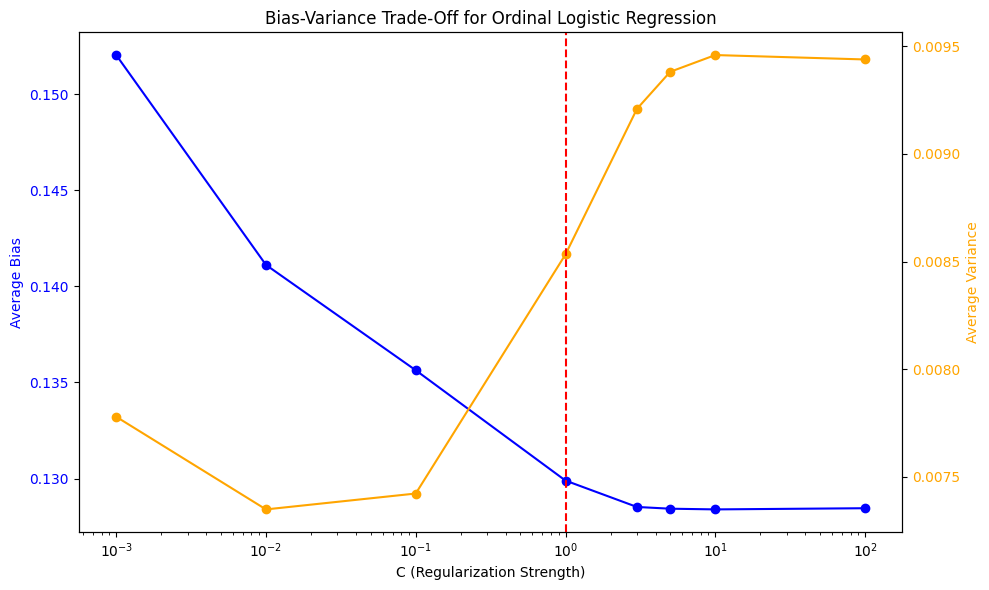

In [282]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot bias with the left y-axis
ax1.plot(C_values, biases, label='Average Bias', color='blue', marker='o')
ax1.set_xscale('log')
ax1.set_xlabel('C (Regularization Strength)')
ax1.set_ylabel('Average Bias', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for variance
ax2 = ax1.twinx()
ax2.plot(C_values, variances, label='Average Variance', color='orange', marker='o')
ax2.set_ylabel('Average Variance', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')
plt.axvline(x=1, color='red', linestyle='--', label='C = 1')

# Add title and show the plot
plt.title('Bias-Variance Trade-Off for Ordinal Logistic Regression')
fig.tight_layout()
plt.show()


In [283]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on X_train and transform X_train
X_train_scaled = scaler.fit_transform(X_train_np)

# Transform X_test using the same scaler
X_test_scaled = scaler.transform(X_test_np)



In [284]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on X_train_selected and transform it
X_train_selected_scaled = scaler.fit_transform(X_train_selected)

# Transform X_test_selected using the same scaler
X_test_selected_scaled = scaler.transform(X_test_selected)

In [285]:
#TODO: Discuss bias-variance trade-off of your ordinal logistic regression model

Bias (in blue) decreases as C increases, which is expected because a higher C value corresponds to weaker regularization, allowing the model to fit the training data more closely and thus reducing bias. Conversely, variance (in orange) increases with C, as lower regularization (higher C) makes the model more flexible and prone to overfitting, leading to higher variance. The red dashed line represents the recommended C value, where the balance between bias and variance is optimal for this model. This point minimizes generalization error, achieving a balance between model flexibility and predictive stability.

# Question 4: Model Tuning

- What are the hyperparameters we can potentially set for our ordinal logistic regression model?
The hyperparameters for the ordinal logistic regression model include C, penalty, solver, max_iter, tol, and multi_class

- Which hyperparameters seem to be worthwhile to tune?
The hyperparameters that seem worthwhile to tune are C and penalty.

## Grid Search

- Grid search will take time to complete - but if it does not finish in a few hours, you're probably trying too many combinations
- A recommended approach is to try a small number of combinations with a wide range first (for continuous value hyperparameters)! Then gradually increase the points that seem to be near optimal

In [286]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score, mean_absolute_error

model = OrdinalLogisticRegression(max_iter=10000)

# Define the parameter grid
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 3,5, 10, 100],
    'penalty': ['l1', 'l2'],

}

scorer = make_scorer(f1_score, average='weighted')

# Set up GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring=scorer, cv=10)
grid_search.fit(X_train_scaled, y_train)

# Get the best model
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Best hyperparameters:", best_params)
print("Best score:", grid_search.best_score_)


Best hyperparameters: {'C': 5, 'penalty': 'l2'}
Best score: 0.8624568997848922


## Visualize the feature importance of your model

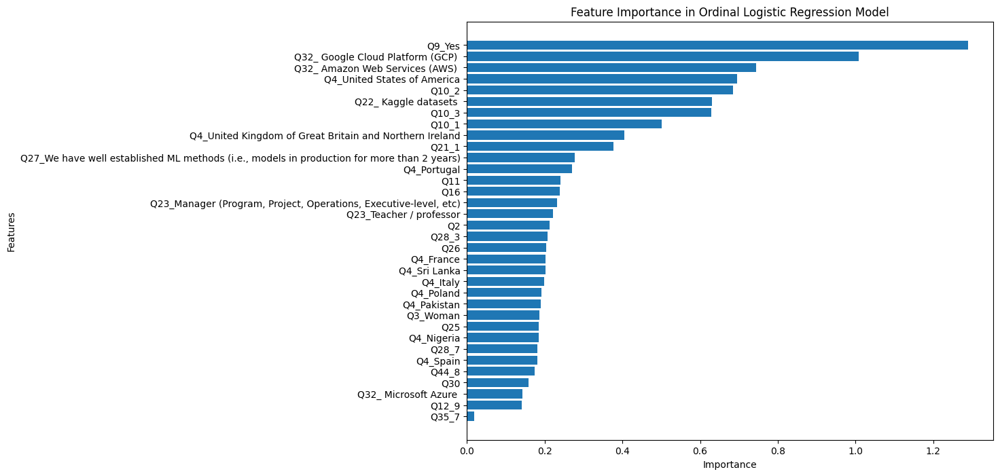

In [287]:
# Initialize an empty list to store the coefficients from each model
all_coefficients = []

# Loop over each binary logistic regression model within `OrdinalLogisticRegression`
for model in best_model.models_:
    all_coefficients.append(np.abs(model.coef_).flatten())

# Calculate the mean coefficient across all models to get an overall importance
mean_coefficients = np.mean(all_coefficients, axis=0)

# Creating a feature importance DataFrame
feature_names = X_train_selected.columns
feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance': mean_coefficients})


feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot the feature importance
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.barh(feature_importance['Feature'], feature_importance['Importance'])
plt.xlabel("Importance")
plt.ylabel("Features")
plt.title("Feature Importance in Ordinal Logistic Regression Model")
plt.gca().invert_yaxis()
plt.show()


# Question 5: Testing

In [288]:
#TODO: Using the best-performing model, evaluate the model performance both on the training set and test set
from sklearn.metrics import accuracy_score, f1_score

# Predict on the training set
y_train_pred = best_model.predict(X_train_selected_scaled)
train_accuracy = accuracy_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred, average='weighted')  # Adjust based on preferred metric

# Predict on the test set
y_test_pred = best_model.predict(X_test_selected_scaled)
test_accuracy = accuracy_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred, average='weighted')

# Print the results
print("Training Accuracy:", train_accuracy)
print("Training F1-Score:", train_f1)
print("Test Accuracy:", test_accuracy)
print("Test F1-Score:", test_f1)


Training Accuracy: 0.8646180860403863
Training F1-Score: 0.866240766009059
Test Accuracy: 0.8619418271200328
Test F1-Score: 0.8635406630580077


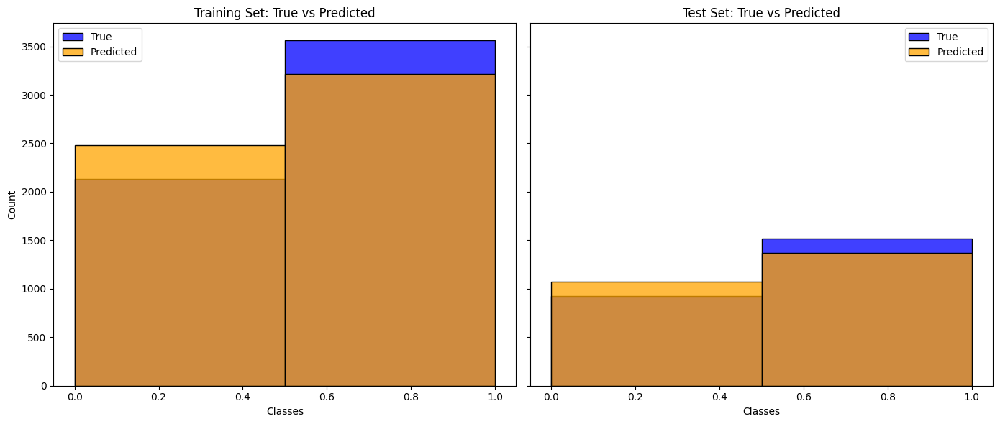

In [289]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot distribution of true vs predicted values for the training set
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Training set
sns.histplot(y_train, kde=False, color="blue", ax=axes[0], label="True", bins=len(set(y_train)))
sns.histplot(y_train_pred, kde=False, color="orange", ax=axes[0], label="Predicted", bins=len(set(y_train)))
axes[0].set_title("Training Set: True vs Predicted")
axes[0].set_xlabel("Classes")
axes[0].set_ylabel("Count")
axes[0].legend()

# Test set
sns.histplot(y_test, kde=False, color="blue", ax=axes[1], label="True", bins=len(set(y_test)))
sns.histplot(y_test_pred, kde=False, color="orange", ax=axes[1], label="Predicted", bins=len(set(y_test)))
axes[1].set_title("Test Set: True vs Predicted")
axes[1].set_xlabel("Classes")
axes[1].legend()

plt.tight_layout()
plt.show()
